In [1]:
import pandas as pd
from functools import reduce 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from pylab import *
import  statsmodels.api as sm
import statsmodels.stats.api as sms
from scipy.stats import boxcox
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import itertools 
from itertools import chain, combinations
import statsmodels.formula.api as smf
import plotly.express as px
from numpy import array
hotel1 = pd.read_csv('C:/Users/lien0/Downloads/hotels1.csv')
hotel2 = pd.read_csv('C:/Users/lien0/Downloads/hotels2.csv')
hotel3 = pd.read_csv('C:/Users/lien0/Downloads/hotels3.csv')
hotel4 = pd.read_csv('C:/Users/lien0/Downloads/hotels4.csv')

# Data Wrangling and Merging data

In [2]:
Hotel1 = pd.merge(hotel1, hotel2, how='outer', on = 'reservation_id')

In [3]:
Hotel1

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,booking_changes,deposit_type,Agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,Reservation_Status,reservation_status_date
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,...,3,No Deposit,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,...,4,No Deposit,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,...,0,No Deposit,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,...,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,...,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,495,Resort Hotel,0,92,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,103.50,1,3,Check-Out,2015-07-20
496,496,Resort Hotel,0,91,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,118.50,0,3,Check-Out,2015-07-20
497,497,Resort Hotel,0,38,2015,July,29,17,1,2,...,1,No Deposit,240.0,0,Transient,192.00,0,1,Check-Out,2015-07-20
498,498,Resort Hotel,0,6,2015,July,29,17,1,2,...,0,No Deposit,142.0,0,Contract,128.27,0,0,Check-Out,2015-07-20


In [4]:
Hotel1.fillna('', inplace=True)
Hotel1

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,booking_changes,deposit_type,Agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,Reservation_Status,reservation_status_date
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,...,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,...,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,...,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,...,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,...,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,495,Resort Hotel,0,92,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,103.50,1,3,Check-Out,2015-07-20
496,496,Resort Hotel,0,91,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,118.50,0,3,Check-Out,2015-07-20
497,497,Resort Hotel,0,38,2015,July,29,17,1,2,...,1,No Deposit,240.0,0,Transient,192.00,0,1,Check-Out,2015-07-20
498,498,Resort Hotel,0,6,2015,July,29,17,1,2,...,0,No Deposit,142.0,0,Contract,128.27,0,0,Check-Out,2015-07-20


In [5]:
Hotel1 = Hotel1.rename({'Reservation_Status':'reservation_status', 'Agent': 'agent'}, axis=1)
Hotel1

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,...,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,...,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,...,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,...,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,...,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,...,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,495,Resort Hotel,0,92,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,103.50,1,3,Check-Out,2015-07-20
496,496,Resort Hotel,0,91,2015,July,29,17,1,2,...,3,No Deposit,240.0,0,Transient,118.50,0,3,Check-Out,2015-07-20
497,497,Resort Hotel,0,38,2015,July,29,17,1,2,...,1,No Deposit,240.0,0,Transient,192.00,0,1,Check-Out,2015-07-20
498,498,Resort Hotel,0,6,2015,July,29,17,1,2,...,0,No Deposit,142.0,0,Contract,128.27,0,0,Check-Out,2015-07-20


In [6]:
Hotel2 = pd.merge(hotel3, hotel4, how='outer', on = 'reservation_id')
Hotel2

,reservation_id,hotel_x,is_canceled_x,lead_time_x,arrival_date_year_x,arrival_date_month_x,arrival_date_week_number_x,arrival_date_day_of_month_x,stays_in_weekend_nights_x,stays_in_week_nights_x,...,deposit_type_y,agent_y,days_in_waiting_list_y,customer_type_y,adr_y,required_car_parking_spaces_y,total_of_special_requests_y,reservation_status_y,reservation_status_date_y,company_y
0,500,Resort Hotel,0.0,13.0,2015.0,July,29.0,17.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,501,Resort Hotel,1.0,32.0,2015.0,July,29.0,17.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,502,Resort Hotel,0.0,315.0,2015.0,July,29.0,17.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,503,Resort Hotel,0.0,8.0,2015.0,July,29.0,17.0,1.0,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,504,Resort Hotel,1.0,0.0,2015.0,July,29.0,17.0,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118885,119385,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,No Deposit,394.0,0.0,Transient,96.14,0.0,0.0,Check-Out,2017-09-06,NaN
118886,119386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,No Deposit,9.0,0.0,Transient,225.43,0.0,2.0,Check-Out,2017-09-07,NaN
118887,119387,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,No Deposit,9.0,0.0,Transient,157.71,0.0,4.0,Check-Out,2017-09-07,NaN
118888,119388,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,No Deposit,89.0,0.0,Transient,104.40,0.0,0.0,Check-Out,2017-09-07,NaN


In [7]:
Hotel2.fillna('', inplace=True)
Hotel2

,reservation_id,hotel_x,is_canceled_x,lead_time_x,arrival_date_year_x,arrival_date_month_x,arrival_date_week_number_x,arrival_date_day_of_month_x,stays_in_weekend_nights_x,stays_in_week_nights_x,...,deposit_type_y,agent_y,days_in_waiting_list_y,customer_type_y,adr_y,required_car_parking_spaces_y,total_of_special_requests_y,reservation_status_y,reservation_status_date_y,company_y
0,500,Resort Hotel,0.0,13.0,2015.0,July,29.0,17.0,1.0,2.0,...,,,,,,,,,,
1,501,Resort Hotel,1.0,32.0,2015.0,July,29.0,17.0,1.0,2.0,...,,,,,,,,,,
2,502,Resort Hotel,0.0,315.0,2015.0,July,29.0,17.0,1.0,2.0,...,,,,,,,,,,
3,503,Resort Hotel,0.0,8.0,2015.0,July,29.0,17.0,1.0,2.0,...,,,,,,,,,,
4,504,Resort Hotel,1.0,0.0,2015.0,July,29.0,17.0,0.0,1.0,...,,,,,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118885,119385,,,,,,,,,,...,No Deposit,394.0,0.0,Transient,96.14,0.0,0.0,Check-Out,2017-09-06,
118886,119386,,,,,,,,,,...,No Deposit,9.0,0.0,Transient,225.43,0.0,2.0,Check-Out,2017-09-07,
118887,119387,,,,,,,,,,...,No Deposit,9.0,0.0,Transient,157.71,0.0,4.0,Check-Out,2017-09-07,
118888,119388,,,,,,,,,,...,No Deposit,89.0,0.0,Transient,104.4,0.0,0.0,Check-Out,2017-09-07,


In [8]:
Hotel2.dtypes

reservation_id                    int64
hotel_x                          object
is_canceled_x                    object
lead_time_x                      object
arrival_date_year_x              object
                                  ...  
required_car_parking_spaces_y    object
total_of_special_requests_y      object
reservation_status_y             object
reservation_status_date_y        object
company_y                        object
Length: 65, dtype: object

In [9]:
pd.options.display.max_columns = None
Hotel2.head()

,reservation_id,hotel_x,is_canceled_x,lead_time_x,arrival_date_year_x,arrival_date_month_x,arrival_date_week_number_x,arrival_date_day_of_month_x,stays_in_weekend_nights_x,stays_in_week_nights_x,adults_x,children_x,babies_x,meal_x,country_x,market_segment_x,distribution_channel_x,is_repeated_guest_x,previous_cancellations_x,previous_bookings_not_canceled_x,reserved_room_type_x,assigned_room_type_x,booking_changes_x,deposit_type_x,agent_x,days_in_waiting_list_x,customer_type_x,adr_x,required_car_parking_spaces_x,total_of_special_requests_x,reservation_status_x,reservation_status_date_x,company_x,hotel_y,is_canceled_y,lead_time_y,arrival_date_year_y,arrival_date_month_y,arrival_date_week_number_y,arrival_date_day_of_month_y,stays_in_weekend_nights_y,stays_in_week_nights_y,adults_y,children_y,babies_y,meal_y,country_y,market_segment_y,distribution_channel_y,is_repeated_guest_y,previous_cancellations_y,previous_bookings_not_canceled_y,reserved_room_type_y,assigned_room_type_y,booking_changes_y,deposit_type_y,agent_y,days_in_waiting_list_y,customer_type_y,adr_y,required_car_parking_spaces_y,total_of_special_requests_y,reservation_status_y,reservation_status_date_y,company_y
0,500,Resort Hotel,0.0,13.0,2015.0,July,29.0,17.0,1.0,2.0,2.0,0.0,0.0,BB,DEU,Online TA,TA/TO,0.0,0.0,0.0,A,A,0.0,No Deposit,240.0,0.0,Transient,126.3,0.0,2.0,Check-Out,2015-07-20,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,501,Resort Hotel,1.0,32.0,2015.0,July,29.0,17.0,1.0,2.0,2.0,0.0,0.0,BB,PRT,Online TA,TA/TO,0.0,0.0,0.0,D,D,0.0,No Deposit,240.0,0.0,Transient,154.0,0.0,0.0,Canceled,2015-06-24,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,502,Resort Hotel,0.0,315.0,2015.0,July,29.0,17.0,1.0,2.0,2.0,0.0,0.0,BB,IRL,Offline TA/TO,TA/TO,0.0,0.0,0.0,A,D,0.0,No Deposit,171.0,0.0,Transient,96.3,0.0,0.0,Check-Out,2015-07-20,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3,503,Resort Hotel,0.0,8.0,2015.0,July,29.0,17.0,1.0,2.0,2.0,0.0,0.0,BB,GBR,Online TA,TA/TO,0.0,0.0,0.0,A,D,0.0,No Deposit,240.0,0.0,Transient,126.3,0.0,2.0,Check-Out,2015-07-20,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4,504,Resort Hotel,1.0,0.0,2015.0,July,29.0,17.0,0.0,1.0,2.0,0.0,0.0,BB,PRT,Direct,Direct,0.0,0.0,0.0,L,C,0.0,No Deposit,,0.0,Transient,136.0,0.0,0.0,Canceled,2015-07-17,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [10]:
Hotels2 = hotel3.append(hotel4)
Hotels2

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company
0,500,Resort Hotel,0,13,2015,July,29,17,1,2,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,126.30,0,2,Check-Out,2015-07-20,NaN
1,501,Resort Hotel,1,32,2015,July,29,17,1,2,2,0.0,0,BB,PRT,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,240.0,0,Transient,154.00,0,0,Canceled,2015-06-24,NaN
2,502,Resort Hotel,0,315,2015,July,29,17,1,2,2,0.0,0,BB,IRL,Offline TA/TO,TA/TO,0,0,0,A,D,0,No Deposit,171.0,0,Transient,96.30,0,0,Check-Out,2015-07-20,NaN
3,503,Resort Hotel,0,8,2015,July,29,17,1,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,D,0,No Deposit,240.0,0,Transient,126.30,0,2,Check-Out,2015-07-20,NaN
4,504,Resort Hotel,1,0,2015,July,29,17,0,1,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,L,C,0,No Deposit,NaN,0,Transient,136.00,0,0,Canceled,2015-07-17,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN
112486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN
112487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN
112488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN


In [11]:
AllHotel = Hotel1.append(Hotels2)
AllHotel

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN
112486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN
112487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN
112488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN


In [12]:
cols=["arrival_date_year","arrival_date_month","arrival_date_day_of_month"]
AllHotel['arrivaldate'] = AllHotel[cols].apply(lambda x: '-'.join(x.values.astype(str)), axis="columns")
AllHotel.head()


,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.0,0,0,Check-Out,2015-07-01,NaN,2015-July-1
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.0,0,0,Check-Out,2015-07-01,NaN,2015-July-1
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.0,0,0,Check-Out,2015-07-02,NaN,2015-July-1
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.0,0,0,Check-Out,2015-07-02,NaN,2015-July-1
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.0,0,1,Check-Out,2015-07-03,NaN,2015-July-1


In [13]:
AllHotel ["arrivaldate"] = pd.to_datetime(AllHotel["arrivaldate"]).dt.strftime('%m-%d-%y')
AllHotel

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03,NaN,07-01-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN,08-30-17
112486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN,08-31-17
112487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN,08-31-17
112488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN,08-31-17


In [14]:
AllHotel['date']=pd.to_datetime(AllHotel['arrivaldate'])

In [15]:
AllHotel['children'] = AllHotel['children'].fillna(0).astype(int)

In [16]:
AllHotel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119490 entries, 0 to 112489
Data columns (total 35 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   reservation_id                  119490 non-null  int64         
 1   hotel                           119490 non-null  object        
 2   is_canceled                     119490 non-null  int64         
 3   lead_time                       119490 non-null  int64         
 4   arrival_date_year               119490 non-null  int64         
 5   arrival_date_month              119490 non-null  object        
 6   arrival_date_week_number        119490 non-null  int64         
 7   arrival_date_day_of_month       119490 non-null  int64         
 8   stays_in_weekend_nights         119490 non-null  int64         
 9   stays_in_week_nights            119490 non-null  int64         
 10  adults                          119490 non-null  int64  

In [17]:
AllHotel['reservation_status_date']=pd.to_datetime(AllHotel['reservation_status_date'])
AllHotel.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119490 entries, 0 to 112489
Data columns (total 35 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   reservation_id                  119490 non-null  int64         
 1   hotel                           119490 non-null  object        
 2   is_canceled                     119490 non-null  int64         
 3   lead_time                       119490 non-null  int64         
 4   arrival_date_year               119490 non-null  int64         
 5   arrival_date_month              119490 non-null  object        
 6   arrival_date_week_number        119490 non-null  int64         
 7   arrival_date_day_of_month       119490 non-null  int64         
 8   stays_in_weekend_nights         119490 non-null  int64         
 9   stays_in_week_nights            119490 non-null  int64         
 10  adults                          119490 non-null  int64  

In [18]:
AllHotel.drop_duplicates()

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate,date
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15,2015-07-01
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15,2015-07-01
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15,2015-07-01
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15,2015-07-01
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03,NaN,07-01-15,2015-07-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN,08-30-17,2017-08-30
112486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN,08-31-17,2017-08-31
112487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN,08-31-17,2017-08-31
112488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN,08-31-17,2017-08-31


In [19]:
AllHotel.drop('date', axis = 1, inplace = True)

In [31]:
AllHotel['meal'].value_counts()

BB           92397
HB           14475
SC           10650
Undefined     1170
FB             798
Name: meal, dtype: int64

In [32]:
AllHotel["assigned_room_type"].value_counts()

A    74104
D    25341
E     7820
F     3754
G     2561
C     2377
B     2163
H      715
I      363
K      279
P       12
L        1
Name: assigned_room_type, dtype: int64

In [33]:
AllHotel['is_canceled'].value_counts()

0    75176
1    44314
Name: is_canceled, dtype: int64

> 1 means canceled
0 means not-canceled

## Check for Normality

<AxesSubplot:>

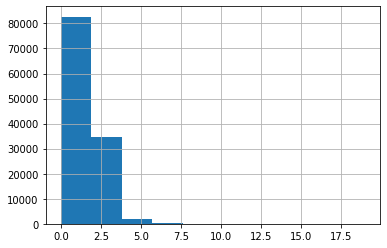

In [20]:
AllHotel.stays_in_weekend_nights.hist()

<AxesSubplot:>

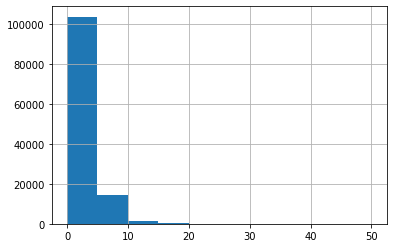

In [21]:
AllHotel.stays_in_week_nights.hist()

C:\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='total_of_special_requests', ylabel='Density'>

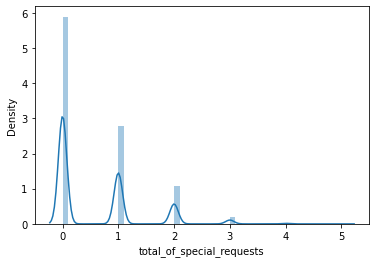

In [22]:
sns.distplot(AllHotel['total_of_special_requests'])

C:\Python39\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='arrival_date_week_number', ylabel='Density'>

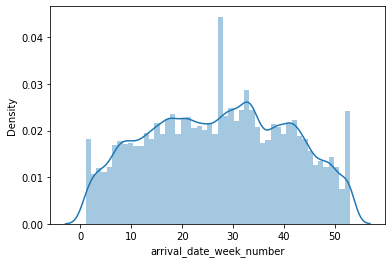

In [23]:
sns.distplot(AllHotel['arrival_date_week_number'])

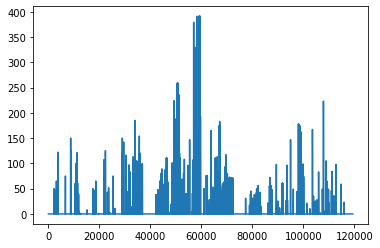

In [24]:
plt.plot(AllHotel["reservation_id"], AllHotel["days_in_waiting_list"])

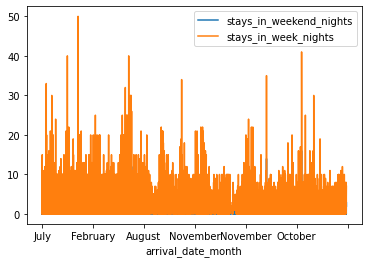

In [25]:
AllHotel.plot(x="arrival_date_month", y=["stays_in_weekend_nights", "stays_in_week_nights"])
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

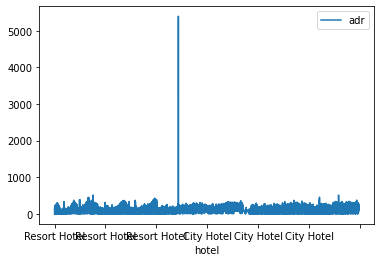

In [26]:
AllHotel.plot(x="hotel", y="adr")
plt.show

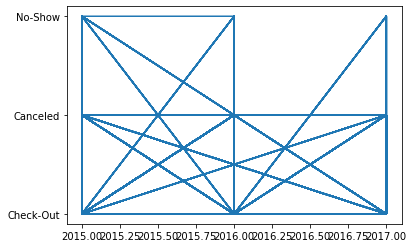

In [28]:
plt.plot(AllHotel["arrival_date_year"], AllHotel["reservation_status"])

In [38]:
import random
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.stats.contingency_tables as ct
from statsmodels.graphics.gofplots import qqplot
from statsmodels.stats.weightstats import ztest
import matplotlib.pyplot as plt 
plt.style.use('default')
plt.style.use ('seaborn-darkgrid')

<AxesSubplot:>

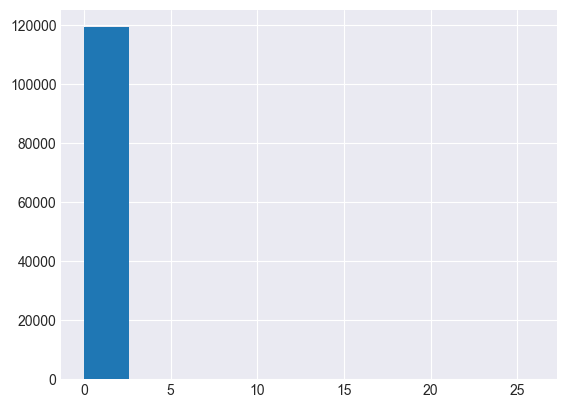

In [39]:
AllHotel['previous_cancellations'].hist()

<AxesSubplot:>

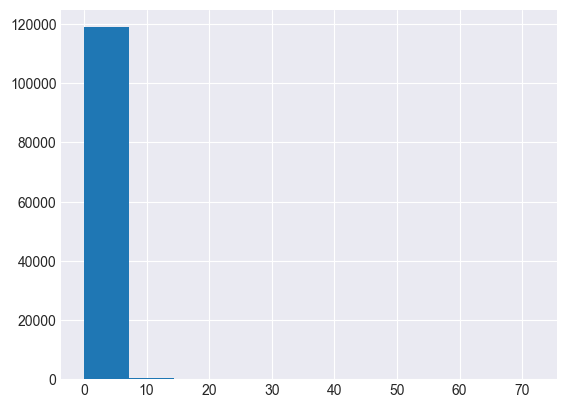

In [40]:
AllHotel['previous_bookings_not_canceled'].hist()

## Statistical analysis - Check for Assumptions

In [41]:
stats.ttest_rel(AllHotel['previous_cancellations'], AllHotel['previous_bookings_not_canceled'])

Ttest_relResult(statistic=-10.774276365886164, pvalue=4.6858747580509295e-27)

>No relation between cancellations and uncancelled bookings pvalue is 4.685. Null accepted

<AxesSubplot:>

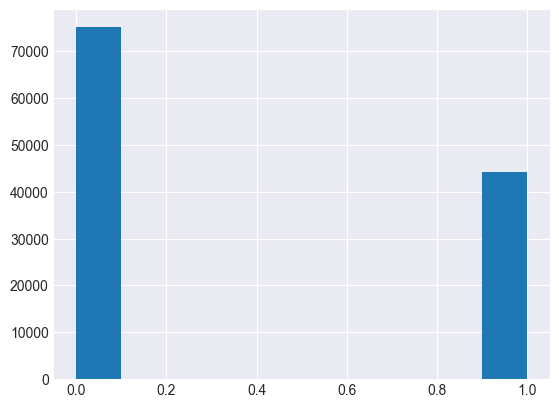

In [42]:
AllHotel['is_canceled'].hist()

<AxesSubplot:>

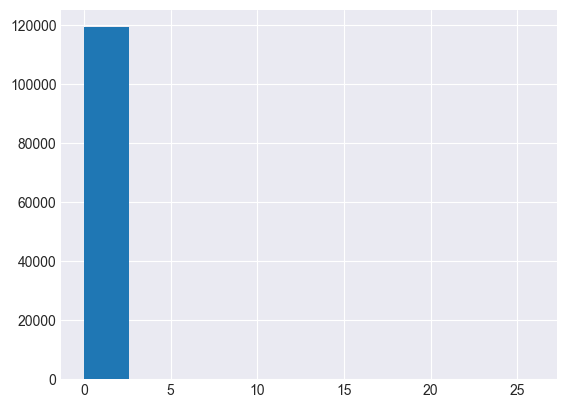

In [43]:
AllHotel['previous_cancellations'].hist()

In [44]:
stats.ttest_rel(AllHotel['is_canceled'], AllHotel['previous_cancellations'])

Ttest_relResult(statistic=106.03983385070737, pvalue=0.0)

 >The realtion between is_canceled and previous_cancellations can conclude that if  
 a person has canceled previously they might have canceled now. 
 Pvalue is less than .05 Null is not accepted

In [45]:
hotelguest = AllHotel[['is_repeated_guest', 'booking_changes']].copy()
print(hotelguest)

        is_repeated_guest  booking_changes
0                       0                3
1                       0                4
2                       0                0
3                       0                0
4                       0                0
...                   ...              ...
112485                  0                0
112486                  0                0
112487                  0                0
112488                  0                0
112489                  0                0

[119490 rows x 2 columns]


> Mann-whitney U Test

In [46]:

stats.mannwhitneyu(x=hotelguest['is_repeated_guest'],
                   y=hotelguest['booking_changes'])

MannwhitneyuResult(statistic=6275642040.0, pvalue=0.0)

### P-value is less than .05 we can reject the null. There is significant difference in booking changes between guest that that are repeated and not repaeated.

> Data Wrangle index

In [47]:
AllHotel[AllHotel.index.duplicated()]

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate
0,500,Resort Hotel,0,13,2015,July,29,17,1,2,2,0,0,BB,DEU,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,126.30,0,2,Check-Out,2015-07-20,NaN,07-17-15
1,501,Resort Hotel,1,32,2015,July,29,17,1,2,2,0,0,BB,PRT,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,240.0,0,Transient,154.00,0,0,Canceled,2015-06-24,NaN,07-17-15
2,502,Resort Hotel,0,315,2015,July,29,17,1,2,2,0,0,BB,IRL,Offline TA/TO,TA/TO,0,0,0,A,D,0,No Deposit,171.0,0,Transient,96.30,0,0,Check-Out,2015-07-20,NaN,07-17-15
3,503,Resort Hotel,0,8,2015,July,29,17,1,2,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,D,0,No Deposit,240.0,0,Transient,126.30,0,2,Check-Out,2015-07-20,NaN,07-17-15
4,504,Resort Hotel,1,0,2015,July,29,17,0,1,2,0,0,BB,PRT,Direct,Direct,0,0,0,L,C,0,No Deposit,NaN,0,Transient,136.00,0,0,Canceled,2015-07-17,NaN,07-17-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6495,13395,Resort Hotel,1,300,2017,August,33,13,2,5,2,0,0,BB,PRT,Online TA,TA/TO,0,0,0,G,G,0,No Deposit,241.0,0,Transient,219.60,0,0,Canceled,2016-10-17,NaN,08-13-17
6496,13396,Resort Hotel,1,285,2017,August,33,13,2,5,2,0,0,BB,DEU,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,138.38,0,1,Canceled,2016-11-13,NaN,08-13-17
6497,13397,Resort Hotel,1,102,2017,August,33,13,3,5,2,0,0,BB,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,196.0,0,Transient,230.00,0,0,Canceled,2017-05-17,NaN,08-13-17
6498,13398,Resort Hotel,1,216,2017,August,33,13,4,6,2,1,0,HB,GBR,Direct,Direct,0,0,0,A,A,1,No Deposit,250.0,0,Transient,180.50,0,0,Canceled,2017-08-05,NaN,08-13-17


In [48]:
AllHotel.reset_index(drop=True, inplace=True)
AllHotel

,reservation_id,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,company,arrivaldate
0,0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15
1,1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,0,Transient,0.00,0,0,Check-Out,2015-07-01,NaN,07-01-15
2,2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15
3,3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,0,Transient,75.00,0,0,Check-Out,2015-07-02,NaN,07-01-15
4,4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,0,Transient,98.00,0,1,Check-Out,2015-07-03,NaN,07-01-15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119485,119385,City Hotel,0,23,2017,August,35,30,2,5,2,0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,0,Transient,96.14,0,0,Check-Out,2017-09-06,NaN,08-30-17
119486,119386,City Hotel,0,102,2017,August,35,31,2,5,3,0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,0,Transient,225.43,0,2,Check-Out,2017-09-07,NaN,08-31-17
119487,119387,City Hotel,0,34,2017,August,35,31,2,5,2,0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,0,Transient,157.71,0,4,Check-Out,2017-09-07,NaN,08-31-17
119488,119388,City Hotel,0,109,2017,August,35,31,2,5,2,0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,0,Transient,104.40,0,0,Check-Out,2017-09-07,NaN,08-31-17


>Make the New Dataset into a CSV file in Drive

In [49]:
AllHotel.to_csv('AllHotel.csv')

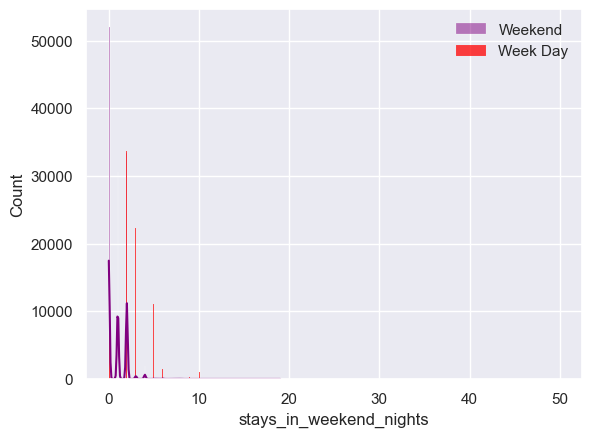

In [58]:
sns.set(style="darkgrid")

sns.histplot(data=AllHotel, x="stays_in_weekend_nights", color="purple", label="Weekend", kde=True)
sns.histplot(data=AllHotel, x="stays_in_week_nights", color="red", label="Week Day", kde=False)

plt.legend() 
plt.show()

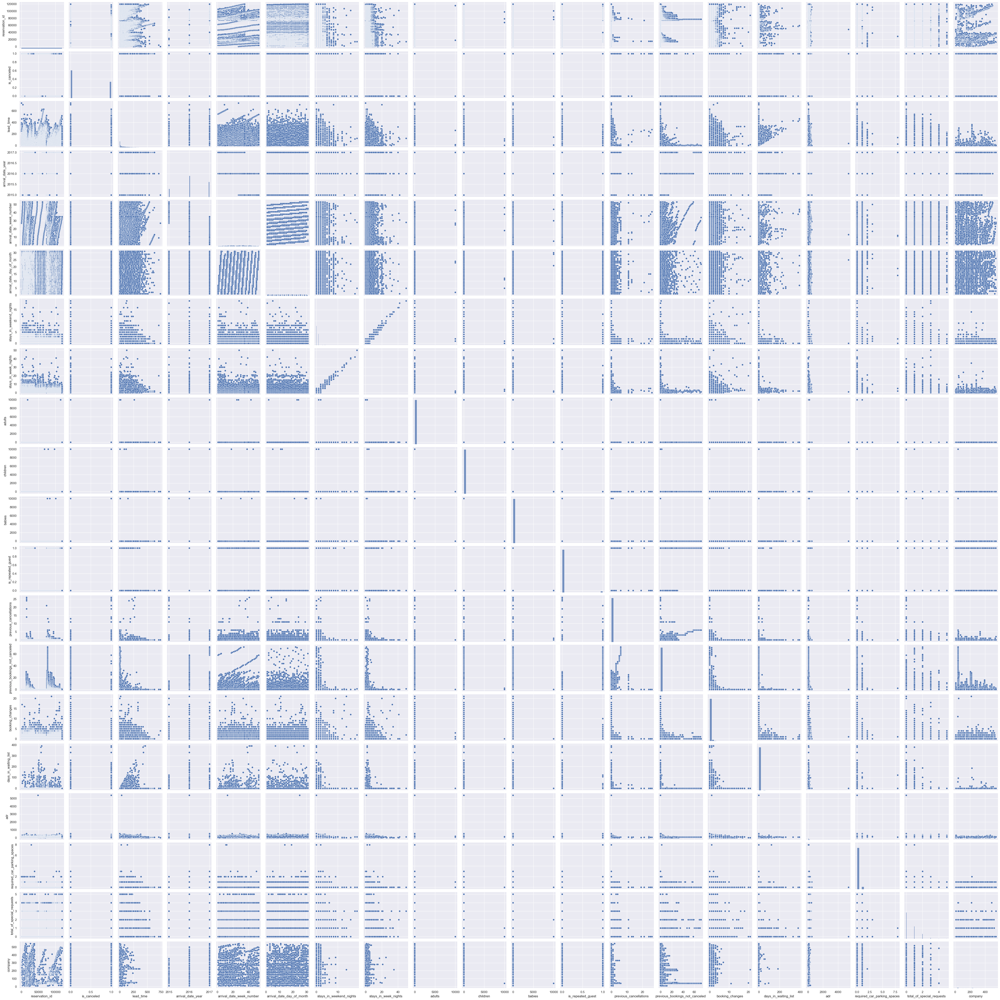

In [51]:
sns.pairplot(AllHotel)

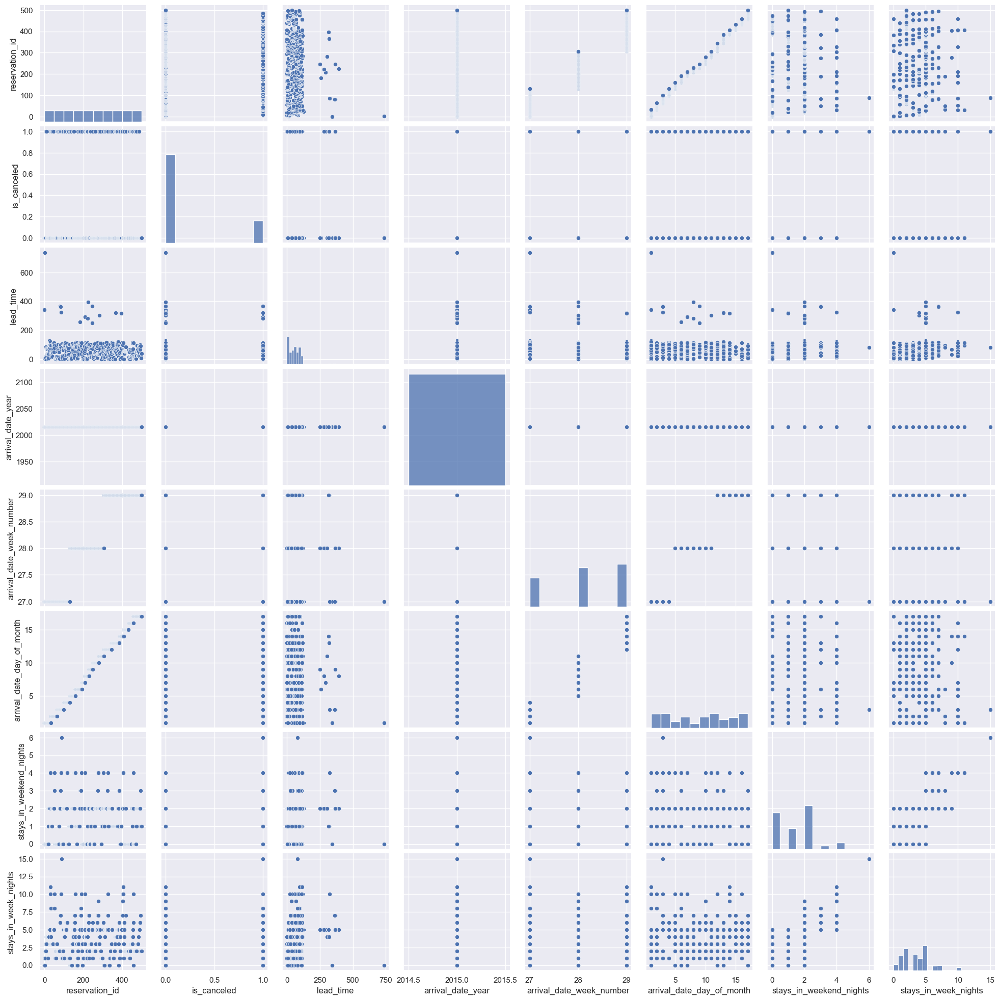

In [59]:
sns.pairplot(hotel1)

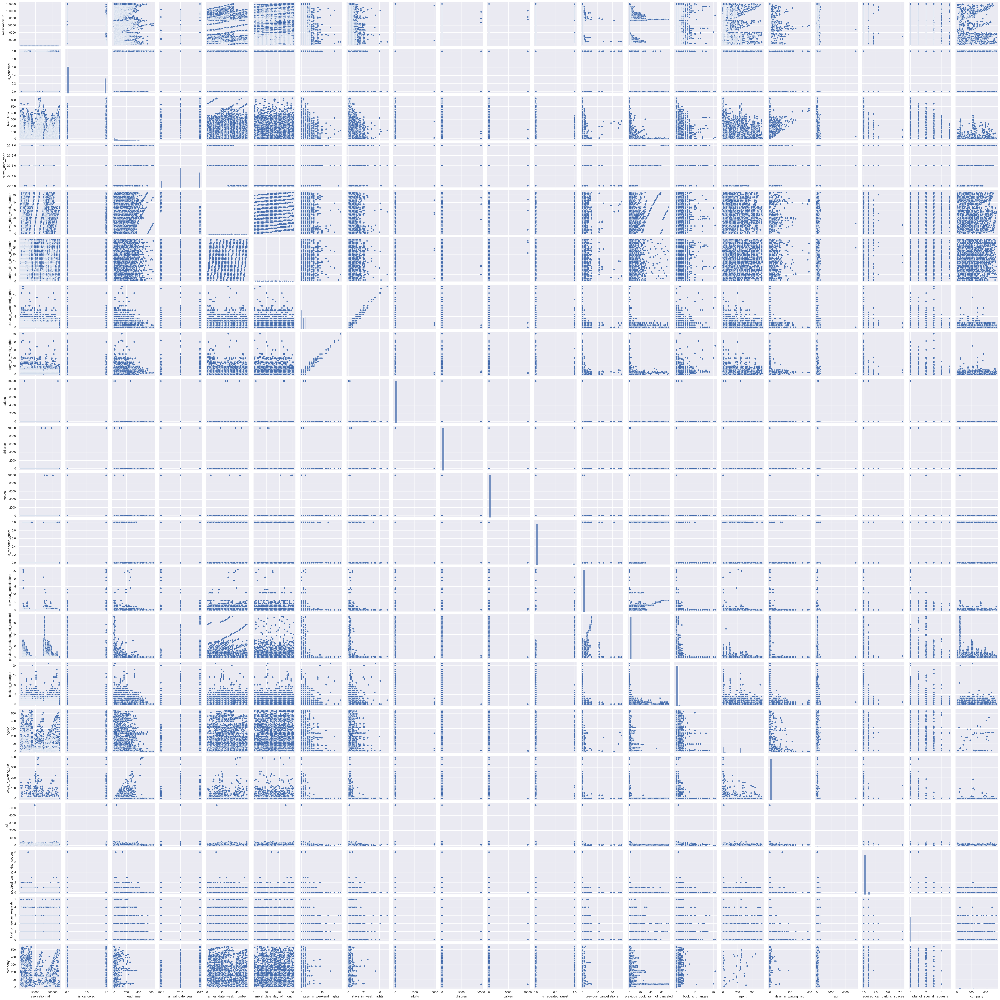

In [60]:
sns.pairplot(hotel4)

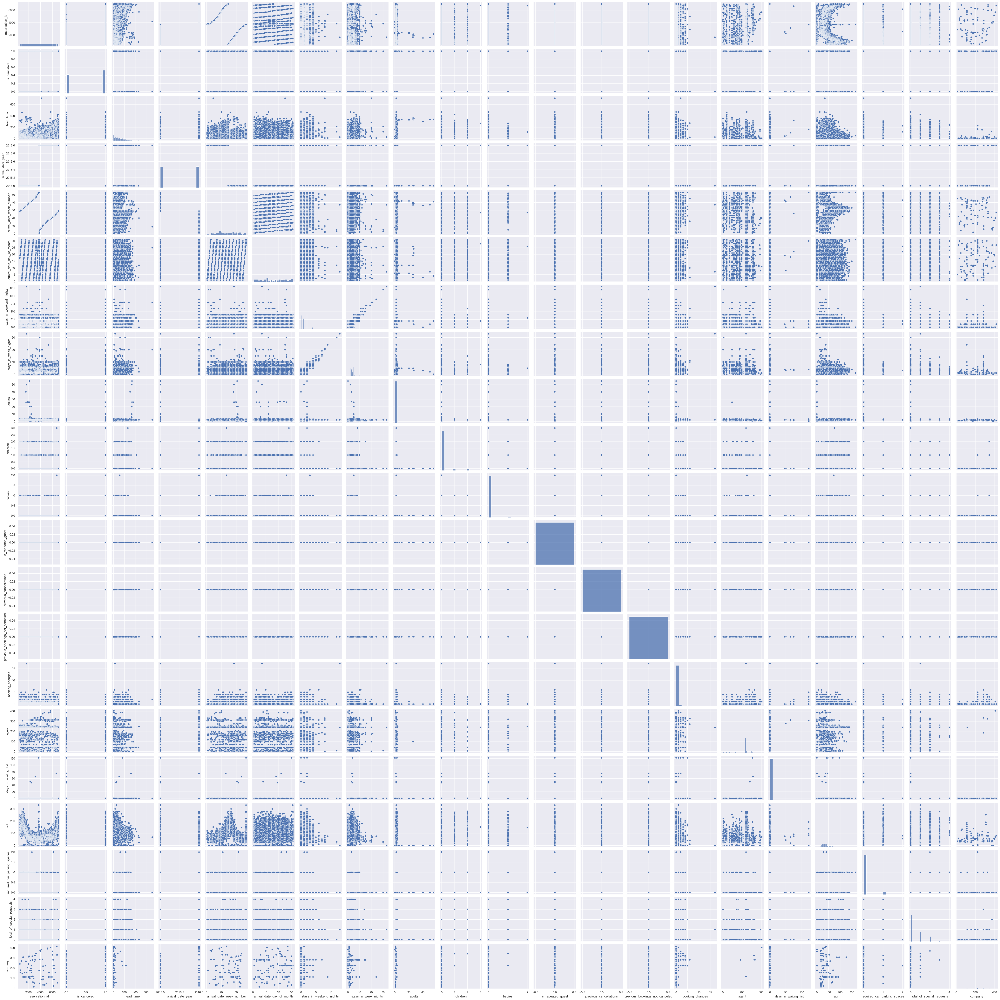

In [61]:
sns.pairplot(hotel3)

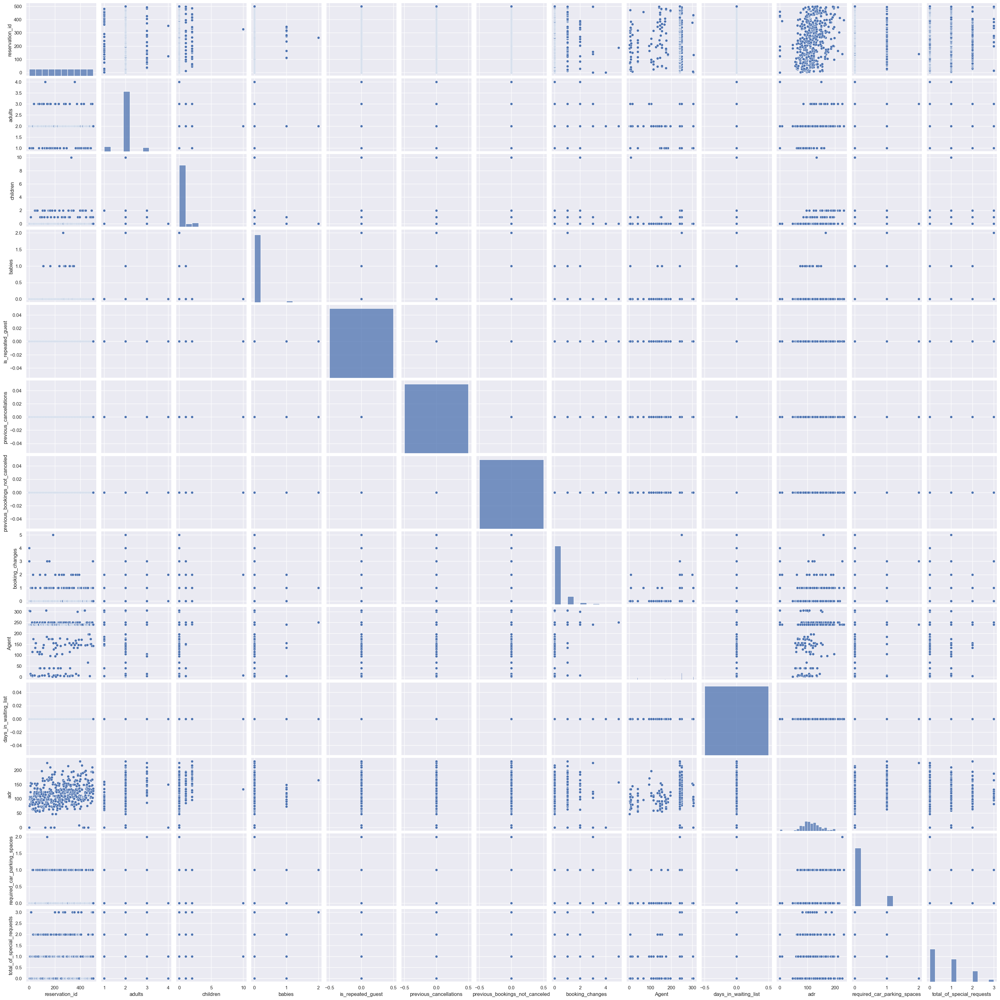

In [62]:
sns.pairplot(hotel2)

## Independant and Dependant variables

In [ ]:
X = AllHotel.iloc[:, :-1].values
X

In [ ]:
y = AllHotel.iloc[:,-1].values
y

## Finding Linear Regressions

In [ ]:
x = AllHotel['arrival_date_day_of_month']
y = AllHotel['lead_time']
model_hotel = sm.OLS(y,x).fit()
print (model_hotel)

In [ ]:
pred_hotel = model_hotel.fittedvalues.copy()
pred_hotel

In [ ]:
true_hotel = AllHotel['lead_time'].values.copy()
true_hotel

In [ ]:
residual_hotel = true_hotel - pred_hotel
residual_hotel

In [ ]:
fig, ax = plt.subplots(figsize=(6,2.5))
_ = ax.scatter(residual_hotel, pred_hotel)


In [ ]:
AllHotel.corr()

In [ ]:
sns.heatmap(AllHotel.corr(), annot=True)

In [ ]:
sms.linear_harvey_collier(model_hotel)

> Data is Homoscedsticity

In [ ]:
transformed, _ = boxcox(AllHotel['arrival_date_day_of_month'])

In [ ]:
plt.hist(transformed)

In [ ]:
x = transformed
model1H = sm.OLS(y,x).fit()
model1H.summary()

In [ ]:
pred_h2 = model1H.fittedvalues.copy()
true_h2 = AllHotel['lead_time'].values.copy()
residual_h2 = true_h2 - pred_h2
residual_h2

In [ ]:
model_hotel.summary()

In [ ]:
model1H.summary()

In [ ]:
fig, ax = plt.subplots(figsize=(6, 2.5))
_ = ax.scatter(residual_h2, pred_h2)

### Logistic Regression

In [ ]:
x = AllHotel['lead_time']
y = AllHotel['is_canceled']

In [ ]:
logit = sm.Logit(y,x)
results = logit.fit()
print(results.summary2())

> P>|z| is a significant predictor of whether the person canceled or not and every booking has a likelihood of canceling by .03%. The number of canceled bookings does not have a impact by looking at the Pseudo R-squared of -5.1%.

### Linear Regression

> Finding Normal Distribution

In [ ]:
sns.displot(AllHotel['days_in_waiting_list'])

In [ ]:
sns.displot(AllHotel['lead_time'])

In [ ]:
sns.displot(AllHotel['reservation_id'])

In [ ]:
sns.displot(AllHotel['stays_in_week_nights'])

In [ ]:
sns.displot(AllHotel['adr'])

In [ ]:
sns.displot(AllHotel['booking_changes'])

In [ ]:
sns.displot(AllHotel['reserved_room_type'])

In [ ]:
sns.displot(AllHotel['meal'])

In [ ]:
sns.displot(AllHotel['market_segment'])

In [ ]:
sns.displot(AllHotel['hotel'])

In [ ]:
x = AllHotel['adr']
y= AllHotel['stays_in_week_nights']

In [ ]:
model = sm.OLS(y,x).fit()

In [ ]:
pred_val = model.fittedvalues.copy()
true_val = AllHotel['stays_in_week_nights'].values.copy()
residual = true_val - pred_val

In [ ]:
fig, ax = plt.subplots(figsize=(6, 2.5))
_ = ax.scatter(residual, pred_val)

In [ ]:
sms.diagnostic.het_breuschpagan(residual, AllHotel[['adr']])

> F-value to test for Homoscedasticity is 5487.8 (Very Big) It is Statistically Significant; P-value is 0, this means the assumptions of Homoscedasticity has been met.

In [ ]:
model.summary()

- Omnibus : Greater than 0 - No Normality
- Prob(Omnibus) : 0 - Normality
- Skew: 1.113 (Greater than 0) - feeds off of Omnibus
- Kurtosis: 80.899 - data is Not normal
- Durbin-Watson: 1.014 - Homoscedasticity
- Jarque-Bera (JB): 30237337.047 - Greater than 0 (not normal)
- Prob(JB) : 0
- Cond. No.: 1.00 - low multicollinearity

In [ ]:
Hotel_crosstab = pd.crosstab(AllHotel['country'], AllHotel['previous_bookings_not_canceled'])
Hotel_crosstab

In [ ]:
stats.chi2_contingency(Hotel_crosstab)

> No Significant relationship between country and previous booking. The country does not follow regular bookings.

In [ ]:
Hotel_crosstab2 = pd.crosstab(AllHotel['meal'], AllHotel['adr'])
Hotel_crosstab2

In [ ]:
stats.chi2_contingency(Hotel_crosstab2)

> There is a significant relationship between ADR(average daily rate) and the meal plan.  The Hotel's Daily Rate will give indication to what kind of meal is being offered.